In [ ]:
# we will remove values more than 500 and less than 1


In [2]:
import numpy as np
import pandas as pd
import xgboost as xgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import GridSearchCV
from geopy.distance import geodesic
import matplotlib.pyplot as plt
from torch.utils.data import Subset


df=pd.read_parquet('../main_data_cleaned_aryan2.parquet')
df=df[(df.timestamp>='2023-07-01')&(df.timestamp<'2024-07-01')]
df=df.reset_index(drop=True)

In [ ]:
import numpy as np
import pandas as pd
from sklearn.neighbors import BallTree
from geopy.distance import geodesic
from tqdm.auto import tqdm
import xgboost as xgb
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
import warnings
from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error
warnings.filterwarnings('ignore')

class PM25SpatialInterpolator:
    def __init__(self):
        self.model = None
        self.scaler = None
        self.feature_columns = [
            'latitude', 'longitude', 'temp', 'rh',
            'dist1', 'dist2', 'dist3', 'nn_pm25',
            'hour_sin', 'hour_cos', 'month_sin', 'month_cos', 'weekday'
        ]
    
    def _add_temporal_features(self, df):
        """Add temporal features with cyclical encoding"""
        df['timestamp'] = pd.to_datetime(df['timestamp'])
        df['hour'] = df['timestamp'].dt.hour
        df['month'] = df['timestamp'].dt.month
        df['weekday'] = df['timestamp'].dt.weekday
        
        # Cyclical encoding
        df['hour_sin'] = np.sin(2 * np.pi * df['hour']/24)
        df['hour_cos'] = np.cos(2 * np.pi * df['hour']/24)
        df['month_sin'] = np.sin(2 * np.pi * df['month']/12)
        df['month_cos'] = np.cos(2 * np.pi * df['month']/12)
        return df
    
    def _calculate_spatial_features(self, group):
        if len(group) < 2:
            group = group.copy()
            group['dist1'] = group['dist2'] = group['dist3'] = np.nan
            group['nn_pm25'] = np.nan
            return group
        
        coords = np.radians(group[['latitude', 'longitude']].values)
        pm25_values = group['pm25'].values
        
        tree = BallTree(coords, metric='haversine')
        
        # Query for 4 neighbors (k=4 because first is self)
        distances, indices = tree.query(coords, k=4)
        distances = distances * 6371  # Convert to kilometers
        
        group = group.copy()
        group['dist1'] = distances[:, 1]
        group['dist2'] = distances[:, 2]
        group['dist3'] = distances[:, 3]
        group['nn_pm25'] = np.array([pm25_values[indices[i, 1:4]].mean() 
                                 for i in range(len(group))])
        return group
    
    def prepare_data(self, df, target_timestamp=None):
        """Prepare data for training or inference"""
        df = self._add_temporal_features(df.copy())
        
        if target_timestamp is not None: # not useful section of code- as no point in sending specific timestamp and nans in pm2.5
            # Inference mode - single timestamp
            timestamp_data = df[df['timestamp'] == target_timestamp].copy()
            if len(timestamp_data) < 2:
                raise ValueError("Not enough data points for this timestamp")
            
            timestamp_data = self._calculate_spatial_features(timestamp_data)
            train_data = timestamp_data.dropna(subset=['pm25'])
            predict_data = timestamp_data[timestamp_data['pm25'].isna()]
            
            if len(train_data) == 0:
                raise ValueError("No training data available for this timestamp")
                
            return train_data, predict_data
        else:
            # Training mode - all timestamps
            results = []
            for _, group in tqdm(df.groupby('timestamp'), desc="Processing timestamps"):
                results.append(self._calculate_spatial_features(group))
            full_data = pd.concat(results)
            return full_data.dropna(subset=['pm25'])
    
    def train(self, train_data, tune_hyperparams=False):
        X = train_data[self.feature_columns]
        y = np.log1p(train_data['pm25'])  # Log transform
        
        X_train, X_test, y_train, y_test = train_test_split(
            X, y, test_size=0.2, random_state=42, stratify=train_data['month'])
        
        self.scaler = StandardScaler()
        X_train_scaled = self.scaler.fit_transform(X_train)
        X_test_scaled = self.scaler.transform(X_test)
        
        self.model = xgb.XGBRegressor(
            objective='reg:squarederror',
            n_estimators=2000,
            learning_rate=0.03,
            max_depth=7,
            subsample=0.9,
            colsample_bytree=0.8,
            gamma=0.2,
            reg_alpha=0.1,
            reg_lambda=1.0,
            random_state=42,
            tree_method='hist',
            early_stopping_rounds=50
        )
        
        if tune_hyperparams:
            param_grid = {
                'max_depth': [6, 10, 15],
                'learning_rate': [0.01, 0.05, 0.1],
            }
            grid_search = GridSearchCV(
                estimator=self.model,
                param_grid=param_grid,
                cv=3,
                scoring='neg_mean_squared_error',
                verbose=1
            )
            grid_search.fit(X_train_scaled, y_train)
            self.model = grid_search.best_estimator_
            print('best model: ',grid_search.best_params_)
            
            # Usage after model training:
            evaluate_model(
            model=self.model,
            X_train=X_train,
            X_test=X_test,
            y_train=y_train,
            y_test=y_test,
            scaler=self.scaler  # Pass None if no scaling was used
            )
        else:
            self.model.fit(
                X_train_scaled, y_train,
                eval_set=[(X_test_scaled, y_test)],
                verbose=10
            )
            # Usage after model training:
            evaluate_model(
            model=self.model,
            X_train=X_train,
            X_test=X_test,
            y_train=y_train,
            y_test=y_test,
            scaler=self.scaler  # Pass None if no scaling was used
            )
    
    def predict(self, predict_data):
        """Make predictions on new data"""
        if self.model is None or self.scaler is None:
            raise ValueError("Model not trained yet")
            
        X_new = predict_data[self.feature_columns]
        X_new_scaled = self.scaler.transform(X_new)
        pred_log = self.model.predict(X_new_scaled)
        return np.expm1(pred_log)  # Convert back from log scale
    
    def predict_at_location(self, lat, lon, timestamp, reference_data, k_neighbors=3):
        """Predict using k nearest neighbors with BallTree"""
        if len(reference_data) < k_neighbors:
            raise ValueError(f"Need at least {k_neighbors} reference points")
        
        # Convert to radians
        ref_coords = np.radians(reference_data[['latitude', 'longitude']].values)
        new_coord = np.radians([[lat, lon]])
        
        # Find k nearest neighbors
        tree = BallTree(ref_coords, metric='haversine')
        dists, indices = tree.query(new_coord, k=k_neighbors)
        nearest_refs = reference_data.iloc[indices[0]]
        
        dists=dists[0]*6371
        # print(dists,indices,nearest_refs['sensor_id'])
        # Create feature vector using mean of nearest neighbors
        timestamp = pd.to_datetime(timestamp)
        new_point = pd.DataFrame({
            'latitude': [lat],
            'longitude': [lon],
            # 'u10': [nearest_refs['u10'].mean()],
            # 'v10': [nearest_refs['v10'].mean()],
            'temp': [nearest_refs['temp'].mean()],
            'rh': [nearest_refs['rh'].mean()],
            'timestamp': [timestamp],
            'dist1':[dists[0]],
            'dist2':[dists[1]],
            'dist3':[dists[2]],
            'nn_pm25':[nearest_refs['pm25'].mean()]
        })
        
        # Add temporal features
        new_point = self._add_temporal_features(new_point)
        
        # Calculate spatial features
        combined = pd.concat([reference_data, new_point], ignore_index=True)
        # combined = self._calculate_spatial_features(combined)
        
        return self.predict(combined.iloc[[-1]][self.feature_columns])[0]

        
    def save_model(self, filepath):
        with open(filepath, 'wb') as f:
            pickle.dump(self, f)


def evaluate_model(model, X_train, X_test, y_train, y_test, scaler=None):
    
    if scaler:
        X_train = scaler.transform(X_train)
        X_test = scaler.transform(X_test)
    
    for name, X, y in [("Train", X_train, y_train), ("Test", X_test, y_test)]:
        preds = model.predict(X)
        mse = mean_squared_error(y, preds)
        rmse = np.sqrt(mse)
        mape = mean_absolute_percentage_error(y, preds)
        
        print(f"\n{name} Metrics:")
        print(f"MSE: {mse:.4f}")
        print(f"RMSE: {rmse:.4f}")
        print(f"MAPE: {mape:.4f}")
    
    

In [4]:

df=pd.read_parquet('../main_data_cleaned_aryan2.parquet')
df=df[(df.timestamp>='2023-07-01')&(df.timestamp<'2024-07-01')]
df=df.reset_index(drop=True)

In [6]:
del df['u10']
del df['v10']

In [8]:
df2=df[(df.pm25>=1)&(df.pm25<=500)]

In [7]:
new_data_up=pd.read_parquet('../UP_DATA/main_data_cleaned_aryan2_up_data.parquet')

In [8]:
new_data_up=new_data_up[(new_data_up.pm25<=500)&(new_data_up.pm25>=1)].reset_index(drop=True)

In [20]:
new_data_up.groupby('timestamp')['sensor_id'].count()

timestamp
2023-10-01 01:00:00     29
2023-10-01 02:00:00     26
2023-10-01 03:00:00     26
2023-10-01 04:00:00     26
2023-10-01 05:00:00     26
                      ... 
2025-04-30 19:00:00    219
2025-04-30 20:00:00    221
2025-04-30 21:00:00    215
2025-04-30 22:00:00    214
2025-04-30 23:00:00    213
Name: sensor_id, Length: 12386, dtype: int64

In [24]:
new_data_up2=new_data_up[(new_data_up.timestamp>='2024-01-01')&(new_data_up.timestamp<'2025-01-01')]

In [26]:
new_data_up2.groupby('timestamp')['sensor_id'].count()

timestamp
2024-01-01 00:00:00    115
2024-01-01 01:00:00    114
2024-01-01 02:00:00    113
2024-01-01 03:00:00    112
2024-01-01 04:00:00    111
                      ... 
2024-12-31 19:00:00    184
2024-12-31 20:00:00    185
2024-12-31 21:00:00    184
2024-12-31 22:00:00    182
2024-12-31 23:00:00    184
Name: sensor_id, Length: 8762, dtype: int64

In [29]:
# Initialize and train
interpolator = PM25SpatialInterpolator()
train_data = interpolator.prepare_data(new_data_up2)  # All timestamps
interpolator.train(train_data,tune_hyperparams=False)

import pickle
# save model and scaler
with open('xgb_model_up.pkl', 'wb') as f:
    pickle.dump(interpolator.model, f)
with open('xgb_model_scaler_up.pkl', 'wb') as f:
    pickle.dump(interpolator.scaler, f)

Processing timestamps:   0%|          | 0/8762 [00:00<?, ?it/s]

[0]	validation_0-rmse:1.08243
[10]	validation_0-rmse:0.89887
[20]	validation_0-rmse:0.78253
[30]	validation_0-rmse:0.70751
[40]	validation_0-rmse:0.66090
[50]	validation_0-rmse:0.63071
[60]	validation_0-rmse:0.61010
[70]	validation_0-rmse:0.59527
[80]	validation_0-rmse:0.58380
[90]	validation_0-rmse:0.57475
[100]	validation_0-rmse:0.56581
[110]	validation_0-rmse:0.55799
[120]	validation_0-rmse:0.55057
[130]	validation_0-rmse:0.54283
[140]	validation_0-rmse:0.53576
[150]	validation_0-rmse:0.52906
[160]	validation_0-rmse:0.52198
[170]	validation_0-rmse:0.51453
[180]	validation_0-rmse:0.50849
[190]	validation_0-rmse:0.50241
[200]	validation_0-rmse:0.49576
[210]	validation_0-rmse:0.48906
[220]	validation_0-rmse:0.48307
[230]	validation_0-rmse:0.47869
[240]	validation_0-rmse:0.47371
[250]	validation_0-rmse:0.46894
[260]	validation_0-rmse:0.46457
[270]	validation_0-rmse:0.46122
[280]	validation_0-rmse:0.45725
[290]	validation_0-rmse:0.45428
[300]	validation_0-rmse:0.45148
[310]	validation_0-

NameError: name 'pickle' is not defined

# visuals

In [4]:
pd.set_option('display.max_columns',100)

In [ ]:
from sklearn.neighbors import BallTree
import numpy as np
from tqdm.auto import tqdm
import pandas as pd

def predict_all_timestamps_fast(train_data, interpolator, k_neighbors=3):
    results = []
    
    train_data = interpolator._add_temporal_features(train_data.copy())
    
    for timestamp, group in tqdm(train_data.groupby('timestamp'), desc="Processing timestamps"):
        if len(group) < 2:
            continue
            
        coords = np.radians(group[['latitude', 'longitude']].values)
        pm25_values = group['pm25'].values
        sensor_ids = group['sensor_id'].values
        
        # Single BallTree query for all points
        tree = BallTree(coords, metric='haversine')
        distances, indices = tree.query(coords, k=k_neighbors+1)
    
        features_list = []
        for i in range(len(group)):
            # Get neighbors (excluding self)
            neighbor_indices = indices[i][1:]  # Skip first element (self)
            neighbor_dists = distances[i][1:] * 6371  # Convert to km
            
            # Build feature dict matching your exact structure
            features = {
                'latitude': group.iloc[i]['latitude'],
                'longitude': group.iloc[i]['longitude'],
                # 'u10': group.iloc[neighbor_indices]['u10'].mean(),
                # 'v10': group.iloc[neighbor_indices]['v10'].mean(),
                'temp': group.iloc[neighbor_indices]['temp'].mean(),
                'rh': group.iloc[neighbor_indices]['rh'].mean(),
                'timestamp': timestamp,
                'dist1': neighbor_dists[0],
                'dist2': neighbor_dists[1],
                'dist3': neighbor_dists[2],
                'nn_pm25': pm25_values[indices[i][1:4]].mean(),  # First 3 excluding self
                'hour_sin': group.iloc[i]['hour_sin'],
                'hour_cos': group.iloc[i]['hour_cos'],
                'month_sin': group.iloc[i]['month_sin'],
                'month_cos': group.iloc[i]['month_cos'],
                'weekday': group.iloc[i]['weekday']
            }
            features_list.append(features)
        
        features_df = pd.DataFrame(features_list)
        
        preds = interpolator.predict(features_df[interpolator.feature_columns])
        
        group = group.copy()
        group['predicted_pm25'] = preds
        results.append(group)
    
    return pd.concat(results, ignore_index=True)



In [ ]:
import plotly.graph_objects as go
import numpy as np
from sklearn.neighbors import BallTree

def plot_pm25_predictions(pred_df, delta=10, k_neighbors=3):
    # Calculate prediction discrepancies
    pred_df['discrepancy'] = np.abs(pred_df['pm25'] - pred_df['predicted_pm25'])
    pred_df['highlight'] = pred_df['discrepancy'] > delta
    
    # Create neighbor connections
    edge_data = []
    coords = np.radians(pred_df[['latitude', 'longitude']].values)
    tree = BallTree(coords, metric='haversine')
    
    for i, row in pred_df.iterrows():
        # Query for k+1 neighbors (includes self)
        distances, indices = tree.query([coords[i]], k=k_neighbors+1)
        
        # Skip self and create edges
        for j in range(1, k_neighbors+1):
            neighbor_idx = indices[0][j]
            edge_data.append({
                'sensor_id': row['sensor_id'],
                'neighbor_id': pred_df.iloc[neighbor_idx]['sensor_id'],
                'weight': 1/distances[0][j]  # Inverse distance weighting
            })
    
    lats, lons, hover_texts = [], [], []
    arrow_lats, arrow_lons, arrow_texts = [], [], []
    
    for edge in edge_data:
        src = pred_df[pred_df['sensor_id'] == edge['sensor_id']].iloc[0]
        tgt = pred_df[pred_df['sensor_id'] == edge['neighbor_id']].iloc[0]
        
        # Line segment
        lats.extend([src['latitude'], tgt['latitude'], None])
        lons.extend([src['longitude'], tgt['longitude'], None])
        hover_texts.extend([
            f"Connection: {src['sensor_id']} <- {tgt['sensor_id']}<br>"
            f"Distance: {geodesic((src['latitude'], src['longitude']), (tgt['latitude'], tgt['longitude'])).km:.1f} km<br>"
            f"PM2.5 Flow: {src['pm25']:.1f} <- {tgt['pm25']:.1f} µg/m³"
        ] * 3)
        
        # Arrow marker (placed 40% along the line)
        arrow_lat = src['latitude'] + 0.4 * (tgt['latitude'] - src['latitude'])
        arrow_lon = src['longitude'] + 0.4 * (tgt['longitude'] - src['longitude'])
        arrow_lats.append(arrow_lat)
        arrow_lons.append(arrow_lon)
        arrow_texts.append(f""" Direction: {src['sensor_id']} → {tgt['sensor_id']}<br>Distance: {geodesic((src['latitude'], src['longitude']), (tgt['latitude'], tgt['longitude'])).km:.1f} km<br>PM2.5 Flow: {src['pm25']:.1f} <- {tgt['pm25']:.1f} µg/m³ """)
    
    fig = go.Figure()
    
    fig.add_trace(go.Scattermapbox(
        lat=lats,
        lon=lons,
        mode='lines',
        line=dict(width=1.5, color='rgba(100,200,255,0.6)'),
        hoverinfo='text',
        text=hover_texts,
        name='Neighbor Connections'
    ))
    
    fig.add_trace(go.Scattermapbox(
        lat=arrow_lats,
        lon=arrow_lons,
        mode='markers',
        marker=dict(size=10, color='yellow', symbol='triangle'),
        text=arrow_texts,
        hovertemplate='%{text}<extra></extra>',
        name='Flow Direction'
    ))
    
    highlight_sensors = pred_df[pred_df['highlight']]
    fig.add_trace(go.Scattermapbox(
        lat=highlight_sensors['latitude'],
        lon=highlight_sensors['longitude'],
        mode='markers',
        marker=dict(
            size=12,
            color=highlight_sensors['discrepancy'],
            colorscale='Reds',
            showscale=True,
            colorbar=dict(title='Discrepancy (µg/m³)'),
        ),
        text=highlight_sensors.apply(create_hover_text, axis=1),
        hoverinfo='text',
        name='High Discrepancy'
    ))

    highlight_sensors = pred_df[pred_df['sensor_id']==290]
    fig.add_trace(go.Scattermapbox(
        lat=highlight_sensors['latitude'],
        lon=highlight_sensors['longitude'],
        mode='markers',
        marker=dict(
            size=12,
            color=highlight_sensors['discrepancy'],
            colorscale='Reds',
            showscale=True,
            colorbar=dict(title='Discrepancy (µg/m³)'),
        ),
        text=highlight_sensors.apply(create_hover_text, axis=1),
        hoverinfo='text',
        name='find sensor'
    ))
    
    normal_sensors = pred_df #  [~pred_df['highlight']] keep all
    fig.add_trace(go.Scattermapbox(
        lat=normal_sensors['latitude'],
        lon=normal_sensors['longitude'],
        mode='markers',
        marker=dict(
            size=12,
            color=normal_sensors['pm25'],
            colorscale='Viridis',
            cmin=pred_df['pm25'].min(),
            cmax=pred_df['pm25'].max(),
            opacity=0.8,
            showscale=True,
            colorbar=dict(title='Actual Pm2.5 (µg/m³)'),
        ),
        text=normal_sensors.apply(create_hover_text, axis=1),
        hoverinfo='text',
        name='Sensors (Good Prediction)'
    ))
    
    
    
    fig.update_layout(
        mapbox_style="carto-darkmatter",
        mapbox=dict(
            center=dict(
                lat=pred_df['latitude'].mean(),
                lon=pred_df['longitude'].mean()
            ),
            zoom=10
        ),
        margin=dict(l=0, r=0, t=30, b=0),
        hovermode='closest',
        legend=dict(orientation='h', yanchor='bottom', y=1.02)
    )
    
    return fig

def create_hover_text(row):
    return (
        f"Sensor: {row['sensor_id']}<br>"
        f"Actual PM2.5: {row['pm25']:.1f} µg/m³<br>"
        f"Predicted PM2.5: {row['predicted_pm25']:.1f} µg/m³<br>"
        f"Discrepancy: {row['discrepancy']:.1f} µg/m³<br>"
        f"RH: {row['rh']:.1f}%<br>"
        f"Temp: {row['temp']:.1f}°C<br>"
        # f"Wind: {row['u10']:.1f} m/s (u), {row['v10']:.1f} m/s (v)"
    )

<Axes: xlabel='timestamp'>

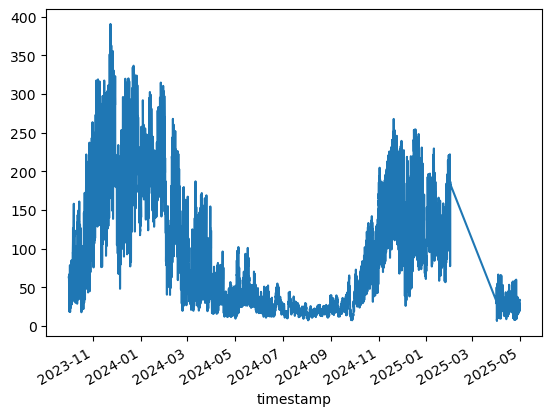

In [35]:
new_data_up.groupby('timestamp')['pm25'].mean().plot()

In [9]:
import pickle
interpolator2=PM25SpatialInterpolator()


with open("xgb_model_up.pkl", 'rb') as f:
    interpolator2.model= pickle.load(f)
with open("xgb_model_scaler_up.pkl", 'rb') as f:
    interpolator2.scaler= pickle.load(f)

all_data_up = interpolator2.prepare_data(new_data_up)  # All timestamps


Processing timestamps:   0%|          | 0/12386 [00:00<?, ?it/s]

In [38]:
all_data_up=all_data_up.sort_values(by='timestamp').reset_index(drop=True)
final_all_data_up=predict_all_timestamps_fast(all_data_up, interpolator2, k_neighbors=3)

Processing timestamps:   0%|          | 0/12386 [00:00<?, ?it/s]

In [39]:
final_all_data_up.to_parquet('../UP_DATA/xgb_model_for_up_predictions_500_cap_nowind.parquet')

In [42]:
from sklearn.metrics import mean_squared_error,mean_absolute_percentage_error,root_mean_squared_error
print('MSE',mean_squared_error(final_all_data_up['pm25'],final_all_data_up['predicted_pm25']))
print('MAPE',mean_absolute_percentage_error(final_all_data_up['pm25'],final_all_data_up['predicted_pm25']))
print('RMSE',root_mean_squared_error(final_all_data_up['pm25'],final_all_data_up['predicted_pm25']))

MSE 1820.1482736092041
MAPE 0.37206256547249406
RMSE 42.663195773514246


In [43]:
final_all_data_up['error']=np.abs(final_all_data_up['pm25']-final_all_data_up['predicted_pm25'])
final_all_data_up['error'].describe().round(2)


count    3565806.00
mean          22.21
std           36.43
min            0.00
25%            2.98
50%            8.77
75%           24.79
max          493.60
Name: error, dtype: float64

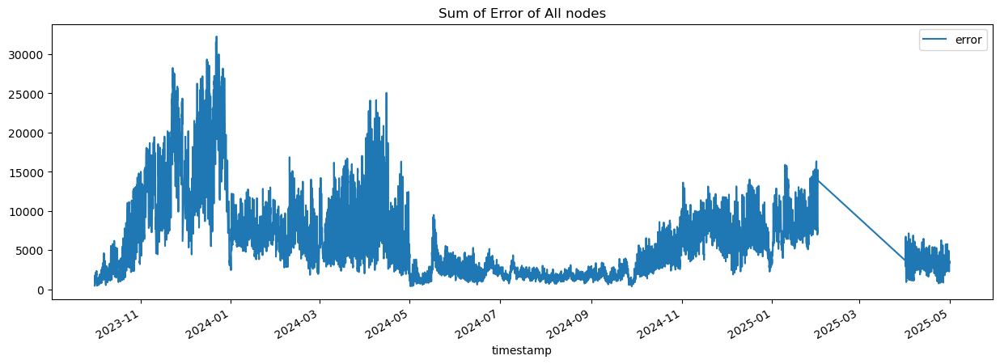

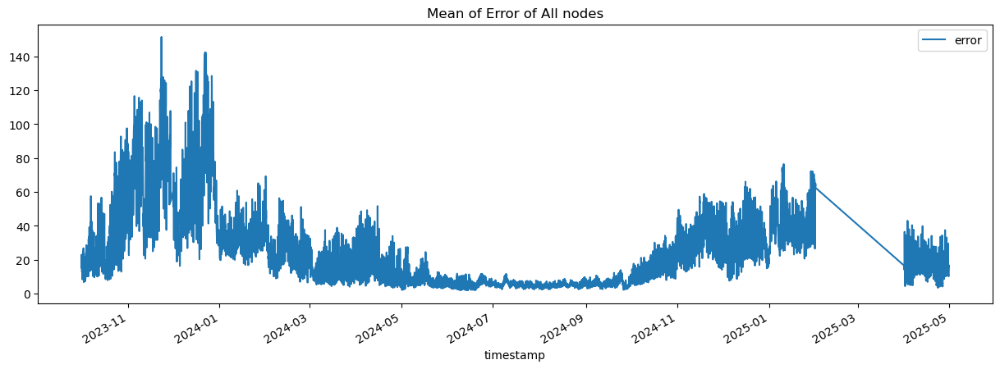

In [44]:
import matplotlib.pyplot as plt
final_all_data_up.groupby('timestamp')['error'].sum().plot(figsize=(15,5),legend=True,title='Sum of Error of All nodes')
plt.show()
final_all_data_up.groupby('timestamp')['error'].mean().plot(figsize=(15,5),legend=True,title='Mean of Error of All nodes')
plt.show()

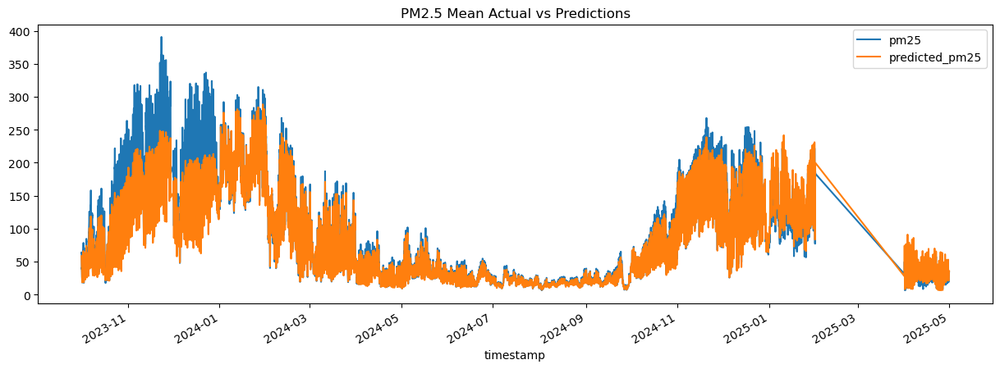

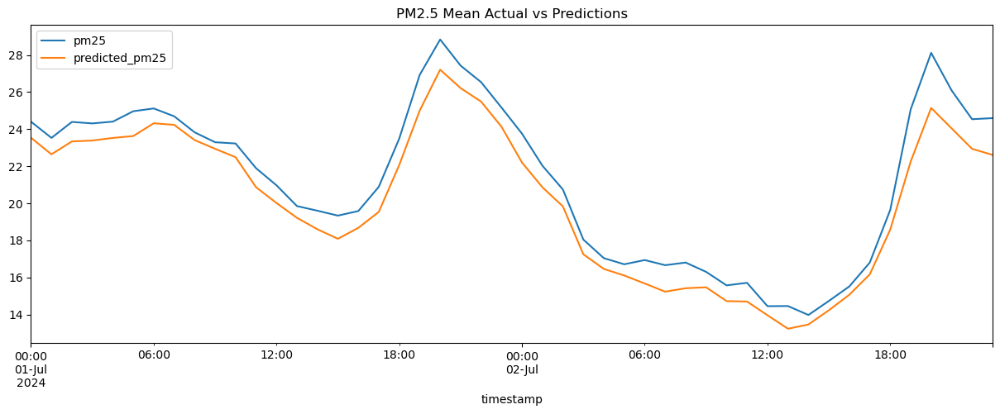

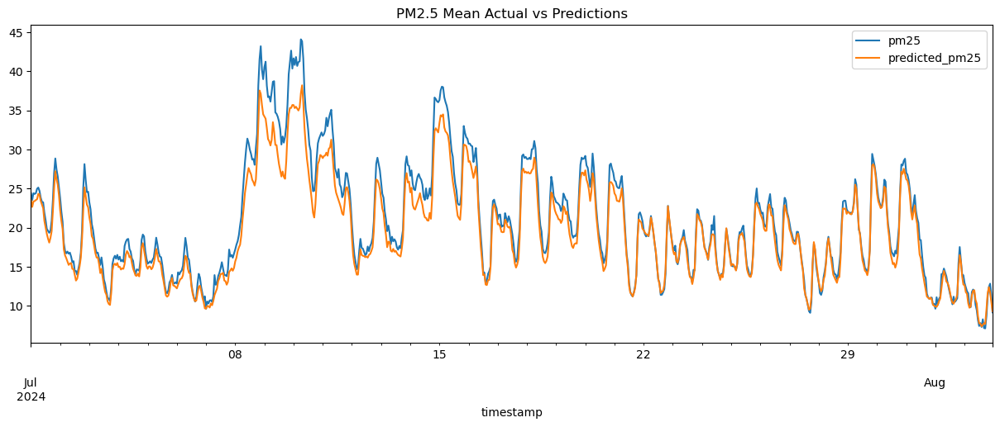

In [45]:
import matplotlib.pyplot as plt
final_all_data_up.groupby('timestamp')[['pm25','predicted_pm25']].mean().plot(figsize=(15,5),legend=True,title='PM2.5 Mean Actual vs Predictions')
plt.show()
# final[final.timestamp<='2023-09-01'].groupby('timestamp')[['pm25','predicted_pm25']].mean().plot(figsize=(15,5),legend=True,title='PM2.5 Mean Actual vs Predictions')
# plt.show()
final_all_data_up[(final_all_data_up.timestamp>='2024-07-01')&(final_all_data_up.timestamp<'2024-07-03')].groupby('timestamp')[['pm25','predicted_pm25']].mean().plot(figsize=(15,5),legend=True,title='PM2.5 Mean Actual vs Predictions')
plt.show()
# final[(final.timestamp>='2024-01-01')&(final.timestamp<'2024-01-03')].groupby('timestamp')[['pm25','predicted_pm25']].mean().plot(figsize=(15,5),legend=True,title='PM2.5 Mean Actual vs Predictions')
# plt.show()
final_all_data_up[(final_all_data_up.timestamp>='2024-07-01')&(final_all_data_up.timestamp<'2024-08-03')].groupby('timestamp')[['pm25','predicted_pm25']].mean().plot(figsize=(15,5),legend=True,title='PM2.5 Mean Actual vs Predictions')
plt.show()

In [46]:
import pandas as pd
import numpy as np
import plotly.graph_objects as go

dates = final_all_data_up.groupby('timestamp')[['pm25','predicted_pm25']].mean().index
values1 = final_all_data_up.groupby('timestamp')[['pm25','predicted_pm25']].mean()['pm25']
values2 = final_all_data_up.groupby('timestamp')[['pm25','predicted_pm25']].mean()['predicted_pm25']

fig = go.Figure()
fig.add_trace(go.Scatter(
    x=dates,
    y=values1,
    mode='lines',
    name='Actual'
))
fig.add_trace(go.Scatter(
    x=dates,
    y=values2,
    mode='lines',
    name='Predicted'
))

fig.update_layout(
    title="PM2.5 Mean of all nodes- Actual vs Predicted",
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=7, label="1w", step="day", stepmode="backward"),
                dict(count=1, label="1m", step="month", stepmode="backward"),
                dict(count=3, label="3m", step="month", stepmode="backward"),
                dict(step="all")
            ])
        ),
        rangeslider=dict(visible=True),
        type="date"
    ),
    yaxis_title="Value"
)

fig.show()


In [40]:

url='https://gist.githubusercontent.com/GauravSahu/6705332/raw/0e9a2d90d0b589345811b8434378e67ab52d235f/UttarPradesh.geojson'
import requests
response = requests.get(url)
response.raise_for_status()  # Raises an error if the download failed

with open("up_districts.geojson", "wb") as f:
    f.write(response.content)


In [48]:
# check datewise maps and pred vs actual
fig=plot_pm25_predictions(final_all_data_up[final_all_data_up.timestamp=='2025-04-30 23:00:00'].reset_index(drop=True),10,k_neighbors=3)
fig 

In [ ]:

LAT_MIN, LAT_MAX = 23.52, 31.28
LON_MIN, LON_MAX = 77, 84.7

# Grid spacing ~500m
GRID_SPACING_DEG = 0.0045  

lats = np.arange(LAT_MIN, LAT_MAX, GRID_SPACING_DEG)
lons = np.arange(LON_MIN, LON_MAX, GRID_SPACING_DEG)
grid_lat, grid_lon = np.meshgrid(lats, lons, indexing="ij")

grid_points = np.c_[grid_lat.ravel(), grid_lon.ravel()]



In [ ]:
from sklearn.neighbors import BallTree
import numpy as np
import pandas as pd
from tqdm.auto import tqdm
    
def predict_for_grid_points(train_data, grid_points, interpolator, k_neighbors=3, max_dist_km=100):
    grid_points=pd.DataFrame(grid_points)
    grid_points.columns=['latitude','longitude']
    
    results = []
    
    
    for timestamp, sensors_df in tqdm(train_data.groupby("timestamp"), desc="Processing timestamps"):
        grid_points['timestamp']=timestamp

        grid_t = grid_points[grid_points["timestamp"] == timestamp].copy()
        if len(grid_t) == 0:
            continue
        
        coords_sensors = np.radians(sensors_df[['latitude', 'longitude']].values)
        tree = BallTree(coords_sensors, metric='haversine')
        
        coords_grid = np.radians(grid_t[['latitude', 'longitude']].values)
        

        distances, indices = tree.query(coords_grid, k=k_neighbors)
        distances = distances * 6371  # convert to km
        
        feature_list = []
        for i, grid_row in tqdm(enumerate(grid_t.itertuples(index=False)), total=len(grid_t)):
            nn_idx = indices[i]
            nn_dist = distances[i]
            
            # Filter within max distance
            mask = nn_dist <= max_dist_km
            if not np.any(mask):
                continue  # skip if no neighbors
            
            nn_idx = nn_idx[mask]
            nn_dist = nn_dist[mask]
            
            nearest = sensors_df.iloc[nn_idx]
            
            features = {
                "latitude": grid_row.latitude,
                "longitude": grid_row.longitude,
                # "u10": nearest["u10"].mean(),
                # "v10": nearest["v10"].mean(),
                "temp": nearest["temp"].mean(),
                "rh": nearest["rh"].mean(),
                "timestamp": timestamp,
                "nn_pm25": nearest["pm25"].mean(),
                "dist1": nn_dist[0] if len(nn_dist) > 0 else np.nan,
                "dist2": nn_dist[1] if len(nn_dist) > 1 else np.nan,
                "dist3": nn_dist[2] if len(nn_dist) > 2 else np.nan,
                "hour_sin": sensors_df.iloc[0]["hour_sin"],
                "hour_cos": sensors_df.iloc[0]["hour_cos"],
                "month_sin": sensors_df.iloc[0]["month_sin"],
                "month_cos": sensors_df.iloc[0]["month_cos"],
                "weekday": sensors_df.iloc[0]["weekday"]
            }
            feature_list.append(features)
            # break
        
        
        if not feature_list:
            continue
        
        features_df = pd.DataFrame(feature_list)
        
        preds = interpolator.predict(features_df[interpolator.feature_columns])
        features_df["pred_pm25"] = preds
        results.append(features_df)
        # break
    
    return pd.concat(results, ignore_index=True)


In [53]:
all_data_up[all_data_up.timestamp=='2024-07-01 00:00:00'].reset_index(drop=True)

,timestamp,pm25,temp,rh,latitude,longitude,old_sensor_id,latitude_for_wind,longitude_for_wind,u10,v10,sensor_id,hour,month,weekday,hour_sin,hour_cos,month_sin,month_cos,dist1,dist2,dist3,nn_pm25
0,2024-07-01,6.333333,32.000000,74.000000,27.165000,80.703620,1208230086,27.25,80.75,0.904526,0.781357,575,0,7,0,0.0,1.0,-0.5,-0.866025,20.503998,27.523324,28.061106,16.838889
1,2024-07-01,4.933333,30.905000,91.630000,25.894650,82.091860,18FE34DFDC36,26.00,82.00,1.507065,0.702255,206,0,7,0,0.0,1.0,-0.5,-0.866025,11.118085,11.674998,23.345080,5.061111
2,2024-07-01,11.333333,32.000000,67.333333,26.595110,83.775080,1212230110,26.50,83.75,0.339096,1.547958,410,0,7,0,0.0,1.0,-0.5,-0.866025,9.234943,12.215142,16.258691,36.933333
3,2024-07-01,4.450000,29.426667,99.736667,26.686990,84.178070,B4E62D57AD14,26.75,84.25,-0.148209,0.891708,425,0,7,0,0.0,1.0,-0.5,-0.866025,27.486412,29.141093,35.348794,38.155556
4,2024-07-01,31.000000,34.000000,69.666667,28.164630,80.417090,1212230040,28.25,80.50,-1.403091,0.423935,809,0,7,0,0.0,1.0,-0.5,-0.866025,15.341522,22.034967,30.761931,32.208974
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
363,2024-07-01,7.000000,30.000000,71.333333,24.378060,78.800940,1208230088,24.50,78.75,4.075424,1.938583,4,0,7,0,0.0,1.0,-0.5,-0.866025,25.314469,37.079003,82.919333,4.777778
364,2024-07-01,12.483333,30.640000,98.755000,25.689270,80.119720,C45BBED2AB6C,25.75,80.00,3.197495,1.362411,139,0,7,0,0.0,1.0,-0.5,-0.866025,29.017787,32.260506,34.873965,10.968254
365,2024-07-01,14.800000,30.496667,100.000000,25.926770,83.430140,5CCF7F76D966,26.00,83.50,1.261948,0.877060,210,0,7,0,0.0,1.0,-0.5,-0.866025,16.733491,17.571912,24.392743,25.805556
366,2024-07-01,28.633333,31.006667,100.000000,26.968850,80.181450,18FE34A4E5E9,27.00,80.25,0.923080,1.169052,512,0,7,0,0.0,1.0,-0.5,-0.866025,7.663901,26.434010,28.255179,14.611111


In [81]:
working_df_for_plot_one_timestamp=all_data_up[all_data_up.timestamp=='2024-07-01 00:00:00'].reset_index(drop=True)
grid_pred_df=predict_for_grid_points(working_df_for_plot_one_timestamp, grid_points, interpolator2, k_neighbors=3, max_dist_km=100)

Processing timestamps:   0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/2722050 [00:00<?, ?it/s]

Before: 1893316 points
After clipping: 11351 points


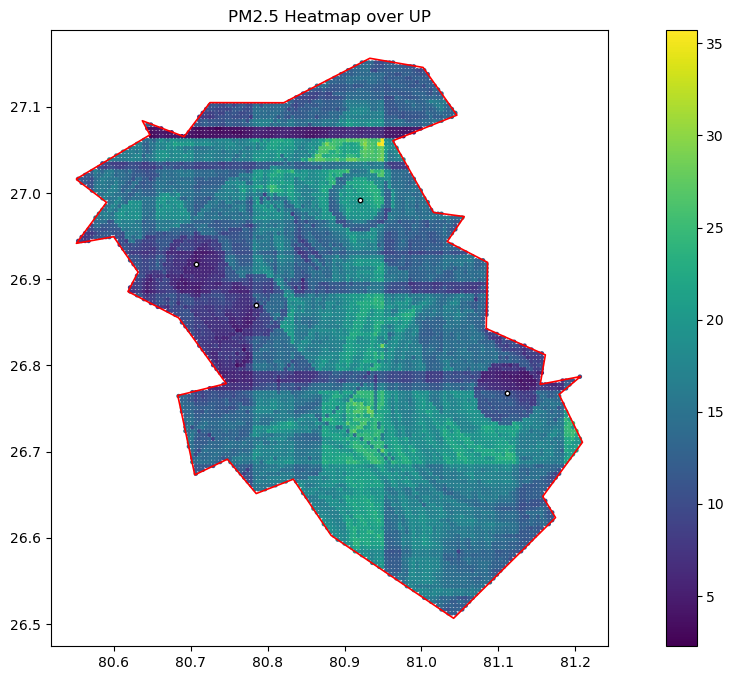

In [ ]:
# sactter plot approach
import geopandas as gpd
import pandas as pd
from shapely.geometry import Point

geometry = [Point(xy) for xy in zip(grid_pred_df["longitude"], grid_pred_df["latitude"])]
grid_gdf = gpd.GeoDataFrame(grid_pred_df, geometry=geometry, crs="EPSG:4326")

up_districts = gpd.read_file("up_districts.geojson")
up_districts=up_districts[up_districts.id=='Lucknow']

grid_in_up = gpd.sjoin(grid_gdf, up_districts, predicate="within")

print("Before:", len(grid_gdf), "points")
print("After clipping:", len(grid_in_up), "points")

# Now plot clipped points
fig, ax = plt.subplots(figsize=(15, 8))
sc = grid_in_up.plot(
    ax=ax,
    column="pred_pm25",
    cmap="viridis",
    markersize=5,
    legend=True
)

up_districts.boundary.plot(ax=ax, color="red", linewidth=1.2)

sensors_gdf = gpd.GeoDataFrame(
    working_df_for_plot_one_timestamp,
    geometry=gpd.points_from_xy(working_df_for_plot_one_timestamp.longitude, working_df_for_plot_one_timestamp.latitude),
    crs="EPSG:4326"
)
sensors_gdf = sensors_gdf.to_crs(up_districts.crs)
sensors_within = sensors_gdf[sensors_gdf.within(up_districts.unary_union)]
sensors_within.plot(ax=ax, color="white", edgecolor="black", markersize=10, marker="o")


plt.title("PM2.5 Heatmap over UP")
plt.savefig("up_pm25_districts.png", dpi=400, bbox_inches="tight")

plt.show()


In [74]:
eteo

NameError: name 'meteo' is not defined

Before: 1893316 points
After clipping: 1069897 points


ValueError: Image size of 80000x32000 pixels is too large. It must be less than 2^16 in each direction.

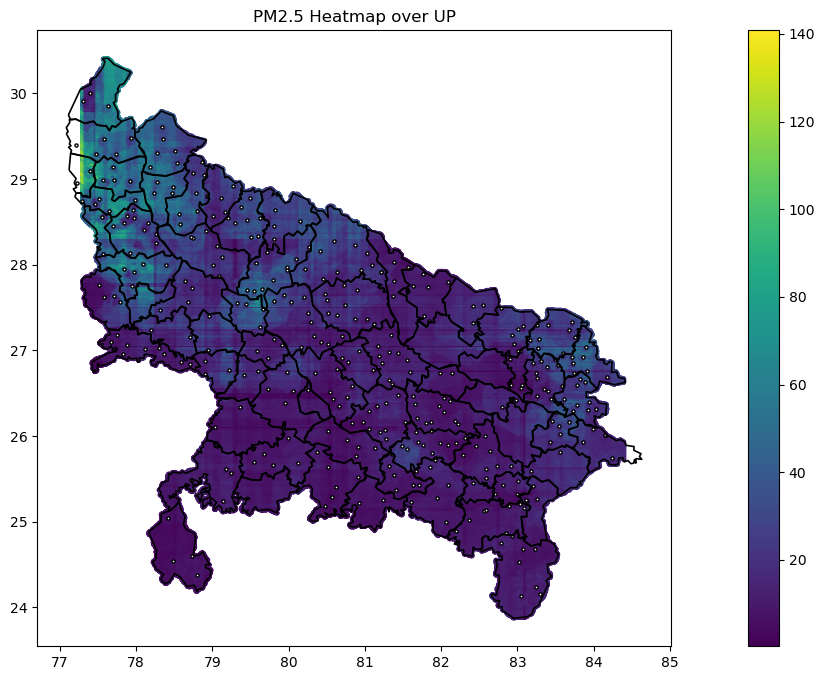

In [ ]:

import geopandas as gpd
import pandas as pd
from shapely.geometry import Point


geometry = [Point(xy) for xy in zip(grid_pred_df["longitude"], grid_pred_df["latitude"])]
grid_gdf = gpd.GeoDataFrame(grid_pred_df, geometry=geometry, crs="EPSG:4326")

india_states = gpd.read_file("/Users/aryanagarwal/Downloads/in.json")
up = india_states[india_states["name"] == "Uttar Pradesh"]
up_districts = gpd.read_file("up_districts.geojson")

grid_in_up = gpd.sjoin(grid_gdf, up, predicate="within")

print("Before:", len(grid_gdf), "points")
print("After clipping:", len(grid_in_up), "points")

# Now plot clipped points
fig, ax = plt.subplots(figsize=(20, 8))
sc = grid_in_up.plot(
    ax=ax,
    column="pred_pm25",
    cmap="viridis",
    markersize=5,
    legend=True
)

# up.boundary.plot(ax=ax, color="red", linewidth=1.2)

up_districts.boundary.plot(ax=ax, color="black", linewidth=1.2)
sensors_gdf = gpd.GeoDataFrame(
    working_df_for_plot_one_timestamp,
    geometry=gpd.points_from_xy(working_df_for_plot_one_timestamp.longitude, working_df_for_plot_one_timestamp.latitude),
    crs="EPSG:4326"
)
sensors_gdf = sensors_gdf.to_crs(up.crs)
sensors_within = sensors_gdf[sensors_gdf.within(up.unary_union)]
sensors_within.plot(ax=ax, color="white", edgecolor="black", markersize=5, marker="o")

plt.title("PM2.5 Heatmap over UP")
plt.savefig("up_pm25_districts.png", dpi=1000, bbox_inches="tight")

plt.show()


In [85]:
fig.savefig("up_pm25_districts.png", dpi=1000, bbox_inches="tight")


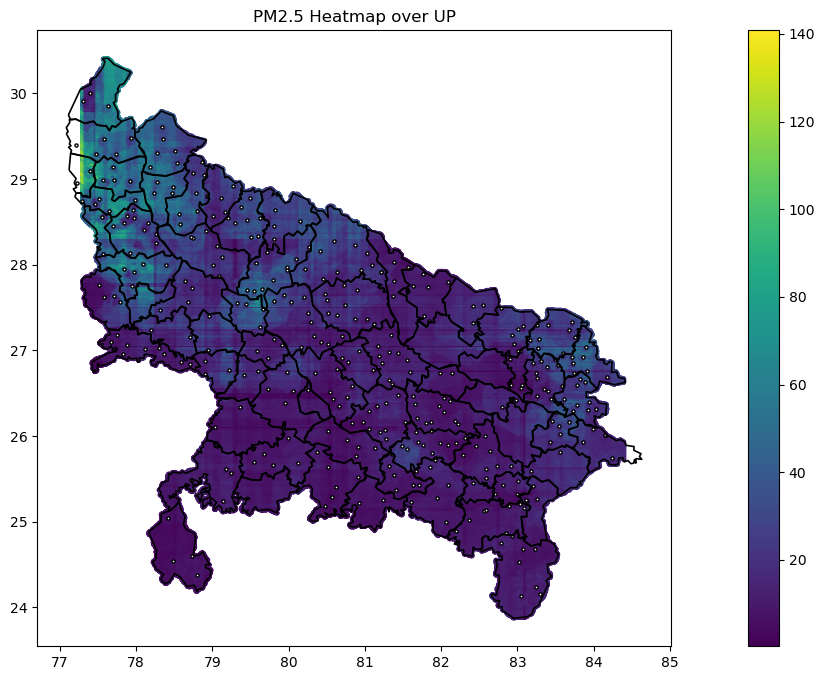

In [86]:
fig

In [87]:
final_all_data_up

,timestamp,pm25,temp,rh,latitude,longitude,old_sensor_id,latitude_for_wind,longitude_for_wind,u10,v10,sensor_id,hour,month,weekday,hour_sin,hour_cos,month_sin,month_cos,dist1,dist2,dist3,nn_pm25,predicted_pm25,error
0,2023-10-01 01:00:00,54.066667,29.760000,76.166667,28.746668,77.289086,4C75250919B2,28.75,77.25,0.458984,-1.934555,888,1,10,6,0.258819,0.965926,-0.866025,0.5,23.131038,23.651065,32.840283,69.733333,64.305779,10.239112
1,2023-10-01 01:00:00,43.200000,31.180000,68.240000,26.021232,80.687280,98F4ABF946EC,26.00,80.75,-2.046875,-1.053696,237,1,10,6,0.258819,0.965926,-0.866025,0.5,12.108312,17.696318,32.432304,36.868376,37.909805,5.290195
2,2023-10-01 01:00:00,68.333333,30.326667,68.526667,28.124558,77.567021,18FE34A2312F,28.00,77.50,0.389648,-1.891586,803,1,10,6,0.258819,0.965926,-0.866025,0.5,74.322196,75.279921,85.460645,65.888889,91.971931,23.638598
3,2023-10-01 01:00:00,86.066667,30.960000,60.553333,27.150610,79.500482,10521CEC2917,27.25,79.50,-1.820312,-0.813461,567,1,10,6,0.258819,0.965926,-0.866025,0.5,18.353295,28.086433,29.227794,84.800000,54.290516,31.776151
4,2023-10-01 01:00:00,16.266667,31.100000,61.293333,26.165470,80.969560,4C11AE09DF70,26.25,81.00,-1.960938,-1.065414,289,1,10,6,0.258819,0.965926,-0.866025,0.5,22.543235,28.368481,32.432304,30.446154,12.484287,3.782379
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3565801,2025-04-30 23:00:00,12.885897,33.252051,100.000000,26.650290,81.314540,4C7525091854,26.75,81.25,-3.851746,-0.744659,420,23,4,2,-0.258819,0.965926,0.866025,-0.5,22.849739,26.184116,33.979055,29.912698,31.752682,18.866784
3565802,2025-04-30 23:00:00,31.500000,28.750000,58.750000,27.582770,79.808220,1209230085,27.50,79.75,-3.658386,0.122528,708,23,4,2,-0.258819,0.965926,0.866025,-0.5,21.246589,22.569400,36.896525,29.727778,27.708323,3.791677
3565803,2025-04-30 23:00:00,37.333333,30.000000,49.333333,26.073760,81.266320,1207230052,26.00,81.25,-3.156433,-0.862823,258,23,4,2,-0.258819,0.965926,0.866025,-0.5,7.825159,11.736728,21.529311,38.112500,36.143303,1.190030
3565804,2025-04-30 23:00:00,12.333333,30.000000,47.000000,26.889100,81.557960,1208230111,27.00,81.50,-4.266785,-0.412628,489,23,4,2,-0.258819,0.965926,0.866025,-0.5,11.138523,14.809732,27.340590,32.805556,23.854082,11.520749


In [44]:
# checking plot of rt rf model vs xgb

In [118]:

LAT_MIN, LAT_MAX = 26.5000,27.1667
LON_MIN, LON_MAX = 80.5000,81.2167

# Grid spacing ~500m
GRID_SPACING_DEG = 0.0045  

# Generate grid of points
lats = np.arange(LAT_MIN, LAT_MAX, GRID_SPACING_DEG)
lons = np.arange(LON_MIN, LON_MAX, GRID_SPACING_DEG)
grid_lat, grid_lon = np.meshgrid(lats, lons, indexing="ij")

grid_points = np.c_[grid_lat.ravel(), grid_lon.ravel()]

with open('../avideep_code/data/final_lucknow_with_lat_long_station_timestamp_station_name_new_split_val.pkl', 'rb') as fp:
    data_luck = pickle.load(fp)
data_luck[0]['Image'].shape

data_luck=[[x['Meteo'][0],x['Meteo'][1],x['Meteo'][2],x['Meteo'][3],x['Meteo'][4],x['Timestamp'],x['PM25']] for x in data_luck]
data_luck=pd.DataFrame(data_luck)
data_luck.columns=['temp','rh','bp','latitude','longitude','timestamp','pm25']
data_luck['timestamp']=pd.to_datetime(data_luck['timestamp'])

se=data_luck.groupby(['latitude','longitude'])['temp'].count().reset_index().reset_index()[['index','latitude','longitude']]
se.columns=['sensor_id','latitude','longitude']
data_luck2=pd.merge(data_luck,se,on=['latitude','longitude'])
data_luck2['entries']=data_luck2.groupby('timestamp')['sensor_id'].transform('nunique')
data_luck2=data_luck2[data_luck2.entries>4].reset_index(drop=True)
import pickle
interpolator2=PM25SpatialInterpolator()

with open("xgb_model_up.pkl", 'rb') as f:
    interpolator2.model= pickle.load(f)
with open("xgb_model_scaler_up.pkl", 'rb') as f:
    interpolator2.scaler= pickle.load(f)

data_luck22 = interpolator2.prepare_data(data_luck2)  # All timestamps
data_luck22[data_luck22.timestamp=='2022-12-07'].reset_index(drop=True)

working_df_for_plot_one_timestamp=data_luck22[data_luck22.timestamp=='2022-12-07'].reset_index(drop=True)
grid_pred_df=predict_for_grid_points(working_df_for_plot_one_timestamp, grid_points, interpolator2, k_neighbors=3, max_dist_km=100)

Processing timestamps:   0%|          | 0/86 [00:00<?, ?it/s]

Processing timestamps:   0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/23840 [00:00<?, ?it/s]

Before: 23840 points
After clipping: 11344 points


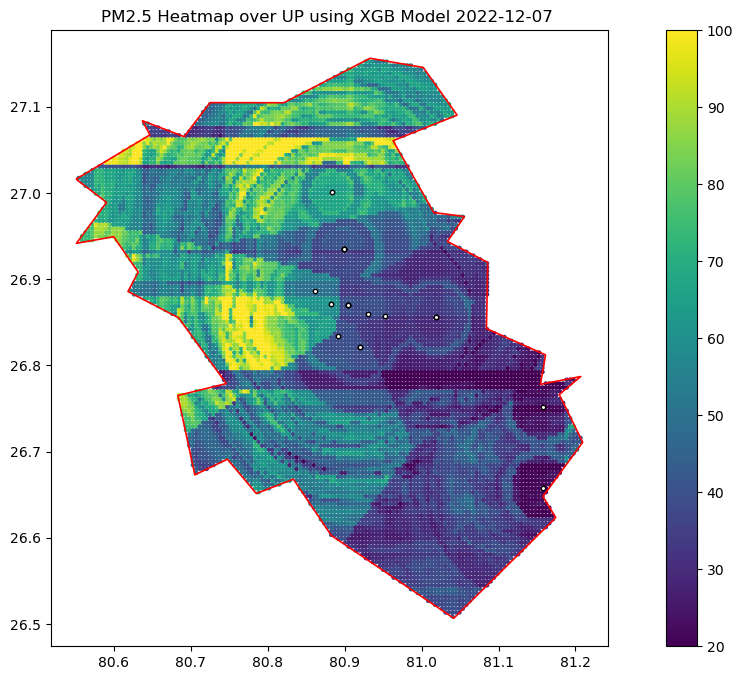

RMSE for grid prediction at sensor location 35.94771372986637
MAPE for grid prediction at sensor location 0.32567991914848404


count     19.000000
mean      23.141459
std       28.262175
min        1.350527
25%        4.158173
50%       15.888729
75%       27.520246
max      111.057260
dtype: float64

In [121]:
# sactter plot approach
import geopandas as gpd
import pandas as pd
from shapely.geometry import Point

# Convert your grid predictions to GeoDataFrame
geometry = [Point(xy) for xy in zip(grid_pred_df["longitude"], grid_pred_df["latitude"])]
grid_gdf = gpd.GeoDataFrame(grid_pred_df, geometry=geometry, crs="EPSG:4326")

# Load India states and filter Bihar
# india_states = gpd.read_file("/Users/aryanagarwal/Downloads/in.json")
# up = india_states[india_states["name"] == "Uttar Pradesh"]
up_districts = gpd.read_file("up_districts.geojson")
up_districts=up_districts[up_districts.id=='Lucknow']

# Spatial join / mask: keep only points inside Bihar
grid_in_up = gpd.sjoin(grid_gdf, up_districts, predicate="within")

print("Before:", len(grid_gdf), "points")
print("After clipping:", len(grid_in_up), "points")

# Now plot clipped points
fig, ax = plt.subplots(figsize=(15, 8))
sc = grid_in_up.plot(
    ax=ax,
    column="pred_pm25",
    cmap="viridis",
    markersize=5,
    vmin=20,   # minimum value on color scale
    vmax=100,  # maximum value on color scale
    legend=True
)

up_districts.boundary.plot(ax=ax, color="red", linewidth=1.2)

sensors_gdf = gpd.GeoDataFrame(
    working_df_for_plot_one_timestamp,
    geometry=gpd.points_from_xy(working_df_for_plot_one_timestamp.longitude, working_df_for_plot_one_timestamp.latitude),
    crs="EPSG:4326"
)
sensors_gdf = sensors_gdf.to_crs(up_districts.crs)
sensors_within = sensors_gdf[sensors_gdf.within(up_districts.unary_union)]
sensors_within.plot(ax=ax, color="white", edgecolor="black", markersize=10, marker="o")


plt.title("PM2.5 Heatmap over UP using XGB Model 2022-12-07 ")
plt.savefig("up_pm25_districts.png", dpi=400, bbox_inches="tight")

plt.show()

from scipy.spatial import cKDTree
grid_coords = grid_in_up[['latitude','longitude']].values
tree = cKDTree(grid_coords)

# 2. Query nearest neighbor for each sensor
sensor_coords = working_df_for_plot_one_timestamp[['latitude','longitude']].values
distances, indices = tree.query(sensor_coords, k=1)

# 3. Attach nearest grid point info to sensors_df
working_df_for_plot_one_timestamp = working_df_for_plot_one_timestamp.copy()
working_df_for_plot_one_timestamp['nearest_grid_lat'] = grid_in_up.iloc[indices]['latitude'].values
working_df_for_plot_one_timestamp['nearest_grid_lon'] = grid_in_up.iloc[indices]['longitude'].values
working_df_for_plot_one_timestamp['nearest_grid_pm25_pred'] = grid_in_up.iloc[indices]['pred_pm25'].values
working_df_for_plot_one_timestamp['dist_to_grid'] = distances  # in degrees if coords are lat/lon
from sklearn.metrics import root_mean_squared_error, mean_absolute_percentage_error
print('RMSE for grid prediction at sensor location',root_mean_squared_error(working_df_for_plot_one_timestamp['pm25'],working_df_for_plot_one_timestamp['nearest_grid_pm25_pred']))
print('MAPE for grid prediction at sensor location',mean_absolute_percentage_error(working_df_for_plot_one_timestamp['pm25'],working_df_for_plot_one_timestamp['nearest_grid_pm25_pred']))
np.abs(working_df_for_plot_one_timestamp['pm25']-working_df_for_plot_one_timestamp['nearest_grid_pm25_pred']).describe()

In [60]:

df=pd.read_parquet('../main_data_cleaned_aryan2.parquet')
df=df[(df.timestamp>='2023-07-01')&(df.timestamp<'2024-07-01')]
df=df.reset_index(drop=True)

df=df[(df.pm25<=500)&(df.pm25>=2)].reset_index(drop=True)

In [65]:
interpolator = PM25SpatialInterpolator()
train_data = interpolator.prepare_data(data_luck2)  # All timestamps
interpolator.train(train_data,tune_hyperparams=False)


# # save model and scaler
# with open('xgb_model_nowind.pkl', 'wb') as f:
#     pickle.dump(interpolator.model, f)
# with open('xgb_model_scaler_nowind.pkl', 'wb') as f:
#     pickle.dump(interpolator.scaler, f)

Processing timestamps:   0%|          | 0/86 [00:00<?, ?it/s]

[0]	validation_0-rmse:0.47818
[10]	validation_0-rmse:0.41124
[20]	validation_0-rmse:0.36672
[30]	validation_0-rmse:0.33558
[40]	validation_0-rmse:0.30925
[50]	validation_0-rmse:0.29268
[60]	validation_0-rmse:0.27938
[70]	validation_0-rmse:0.26852
[80]	validation_0-rmse:0.26225
[90]	validation_0-rmse:0.25926
[100]	validation_0-rmse:0.25706
[110]	validation_0-rmse:0.25706
[120]	validation_0-rmse:0.25675
[130]	validation_0-rmse:0.25595
[140]	validation_0-rmse:0.25551
[150]	validation_0-rmse:0.25551
[160]	validation_0-rmse:0.25505
[170]	validation_0-rmse:0.25464
[180]	validation_0-rmse:0.25463
[190]	validation_0-rmse:0.25466
[200]	validation_0-rmse:0.25464
[210]	validation_0-rmse:0.25464
[220]	validation_0-rmse:0.25425
[230]	validation_0-rmse:0.25426
[240]	validation_0-rmse:0.25425
[250]	validation_0-rmse:0.25343
[260]	validation_0-rmse:0.25303
[270]	validation_0-rmse:0.25305
[280]	validation_0-rmse:0.25305
[290]	validation_0-rmse:0.25290
[300]	validation_0-rmse:0.25280
[310]	validation_0-

In [64]:
df

,timestamp,pm25,temp,rh,sensor_id_old,DID,latitude,longitude,latitude_for_wind,longitude_for_wind,u10,v10,sensor_id
0,2023-07-01 00:00:00,29.587179,28.737308,100.000000,68C63AD46165,68C63AD46165,25.499,84.625,25.4,84.65,-0.419322,1.360387,215
1,2023-07-01 01:00:00,30.233333,28.553333,100.000000,68C63AD46165,68C63AD46165,25.499,84.625,25.4,84.65,-0.004508,1.472284,215
2,2023-07-01 02:00:00,25.533333,28.483333,100.000000,68C63AD46165,68C63AD46165,25.499,84.625,25.4,84.65,-0.070614,1.702796,215
3,2023-07-01 03:00:00,28.012821,28.350256,100.000000,68C63AD46165,68C63AD46165,25.499,84.625,25.4,84.65,-0.261915,1.495153,215
4,2023-07-01 04:00:00,24.466667,28.450000,100.000000,68C63AD46165,68C63AD46165,25.499,84.625,25.4,84.65,-0.032221,1.453618,215
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2584778,2024-06-10 10:00:00,43.333333,38.250000,56.250000,1212220040,1212220040,27.308,84.529,27.4,84.65,2.201567,0.923426,535
2584779,2024-06-11 16:00:00,29.500000,42.000000,44.333333,1212220040,1212220040,27.308,84.529,27.4,84.65,-1.513311,-0.617374,535
2584780,2024-06-12 01:00:00,19.000000,32.000000,75.000000,1212220040,1212220040,27.308,84.529,27.4,84.65,-0.755921,0.166142,535
2584781,2024-06-12 20:00:00,23.000000,34.500000,62.250000,1212220040,1212220040,27.308,84.529,27.4,84.65,-1.216734,-0.538916,535


In [66]:

LAT_MIN, LAT_MAX = 26.5000,27.1667
LON_MIN, LON_MAX = 80.5000,81.2167

# Grid spacing ~500m
GRID_SPACING_DEG = 0.0045  

# Generate grid of points
lats = np.arange(LAT_MIN, LAT_MAX, GRID_SPACING_DEG)
lons = np.arange(LON_MIN, LON_MAX, GRID_SPACING_DEG)
grid_lat, grid_lon = np.meshgrid(lats, lons, indexing="ij")

grid_points = np.c_[grid_lat.ravel(), grid_lon.ravel()]

with open('../avideep_code/data/final_lucknow_with_lat_long_station_timestamp_station_name_new_split_val.pkl', 'rb') as fp:
    data_luck = pickle.load(fp)
data_luck[0]['Image'].shape

data_luck=[[x['Meteo'][0],x['Meteo'][1],x['Meteo'][2],x['Meteo'][3],x['Meteo'][4],x['Timestamp'],x['PM25']] for x in data_luck]
data_luck=pd.DataFrame(data_luck)
data_luck.columns=['temp','rh','bp','latitude','longitude','timestamp','pm25']
data_luck['timestamp']=pd.to_datetime(data_luck['timestamp'])

se=data_luck.groupby(['latitude','longitude'])['temp'].count().reset_index().reset_index()[['index','latitude','longitude']]
se.columns=['sensor_id','latitude','longitude']
data_luck2=pd.merge(data_luck,se,on=['latitude','longitude'])
data_luck2['entries']=data_luck2.groupby('timestamp')['sensor_id'].transform('nunique')
data_luck2=data_luck2[data_luck2.entries>4].reset_index(drop=True)
import pickle
interpolator2=PM25SpatialInterpolator()

with open("xgb_model_nowind.pkl", 'rb') as f:
    interpolator2.model= pickle.load(f)
with open("xgb_model_scaler_nowind.pkl", 'rb') as f:
    interpolator2.scaler= pickle.load(f)

data_luck22 = interpolator2.prepare_data(data_luck2)  # All timestamps
data_luck22[data_luck22.timestamp=='2022-12-07'].reset_index(drop=True)

working_df_for_plot_one_timestamp=data_luck22[data_luck22.timestamp=='2022-12-07'].reset_index(drop=True)
grid_pred_df=predict_for_grid_points(working_df_for_plot_one_timestamp, grid_points, interpolator, k_neighbors=3, max_dist_km=100)

Processing timestamps:   0%|          | 0/86 [00:00<?, ?it/s]

Processing timestamps:   0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/23840 [00:00<?, ?it/s]

In [71]:
hotspots=grid_pred_df[grid_pred_df.pred_pm25>=40] # confirm this value as hotspot threshold or not?
hotspots['sevexrity']=np.where(hotspots.pred_pm25<70,'medium','high') # confirm this range too
len(hotspots)

16793

Before: 23840 points
After clipping: 11344 points


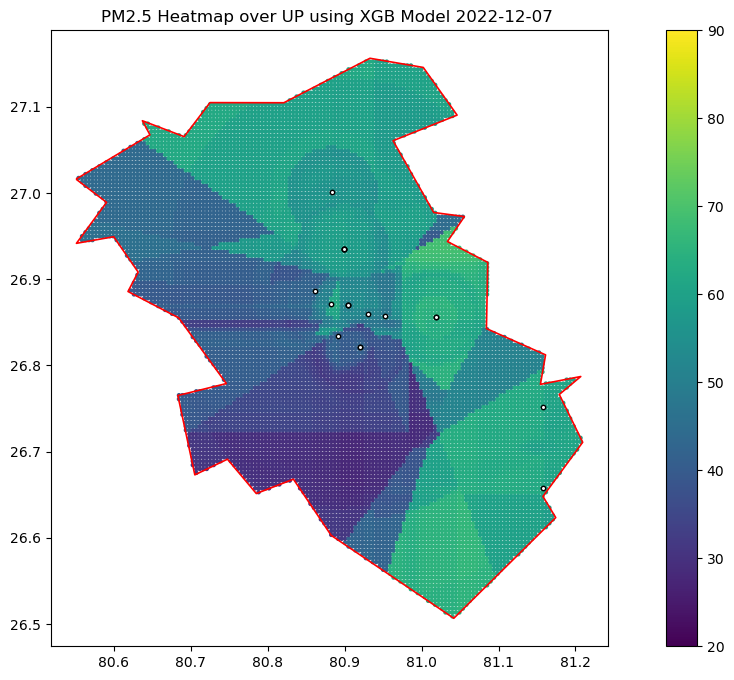

In [72]:
# sactter plot approach
import geopandas as gpd
import pandas as pd
from shapely.geometry import Point

# Convert your grid predictions to GeoDataFrame
geometry = [Point(xy) for xy in zip(grid_pred_df["longitude"], grid_pred_df["latitude"])]
grid_gdf = gpd.GeoDataFrame(grid_pred_df, geometry=geometry, crs="EPSG:4326")

# Load India states and filter Bihar
# india_states = gpd.read_file("/Users/aryanagarwal/Downloads/in.json")
# up = india_states[india_states["name"] == "Uttar Pradesh"]
up_districts = gpd.read_file("up_districts.geojson")
up_districts=up_districts[up_districts.id=='Lucknow']

# Spatial join / mask: keep only points inside Bihar
grid_in_up = gpd.sjoin(grid_gdf, up_districts, predicate="within")

print("Before:", len(grid_gdf), "points")
print("After clipping:", len(grid_in_up), "points")

# Now plot clipped points
fig, ax = plt.subplots(figsize=(15, 8))
sc = grid_in_up.plot(
    ax=ax,
    column="pred_pm25",
    cmap="viridis",
    markersize=5,
    vmin=20,   # minimum value on color scale
    vmax=90,  # maximum value on color scale
    legend=True
)

up_districts.boundary.plot(ax=ax, color="red", linewidth=1.2)

sensors_gdf = gpd.GeoDataFrame(
    working_df_for_plot_one_timestamp,
    geometry=gpd.points_from_xy(working_df_for_plot_one_timestamp.longitude, working_df_for_plot_one_timestamp.latitude),
    crs="EPSG:4326"
)
sensors_gdf = sensors_gdf.to_crs(up_districts.crs)
sensors_within = sensors_gdf[sensors_gdf.within(up_districts.unary_union)]
sensors_within.plot(ax=ax, color="white", edgecolor="black", markersize=10, marker="o")


plt.title("PM2.5 Heatmap over UP using XGB Model 2022-12-07 ")
plt.savefig("up_pm25_districts.png", dpi=400, bbox_inches="tight")

plt.show()


In [117]:
from scipy.spatial import cKDTree
grid_coords = grid_in_up[['latitude','longitude']].values
tree = cKDTree(grid_coords)

# 2. Query nearest neighbor for each sensor
sensor_coords = working_df_for_plot_one_timestamp[['latitude','longitude']].values
distances, indices = tree.query(sensor_coords, k=1)

# 3. Attach nearest grid point info to sensors_df
working_df_for_plot_one_timestamp = working_df_for_plot_one_timestamp.copy()
working_df_for_plot_one_timestamp['nearest_grid_lat'] = grid_in_up.iloc[indices]['latitude'].values
working_df_for_plot_one_timestamp['nearest_grid_lon'] = grid_in_up.iloc[indices]['longitude'].values
working_df_for_plot_one_timestamp['nearest_grid_pm25_pred'] = grid_in_up.iloc[indices]['pred_pm25'].values
working_df_for_plot_one_timestamp['dist_to_grid'] = distances  # in degrees if coords are lat/lon
from sklearn.metrics import root_mean_squared_error, mean_absolute_percentage_error
print('RMSE for grid prediction at sensor location',root_mean_squared_error(working_df_for_plot_one_timestamp['pm25'],working_df_for_plot_one_timestamp['nearest_grid_pm25_pred']))
print('MAPE for grid prediction at sensor location',mean_absolute_percentage_error(working_df_for_plot_one_timestamp['pm25'],working_df_for_plot_one_timestamp['nearest_grid_pm25_pred']))
np.abs(working_df_for_plot_one_timestamp['pm25']-working_df_for_plot_one_timestamp['nearest_grid_pm25_pred']).describe()

RMSE for grid prediction at sensor location 36.02299162024506
MAPE for grid prediction at sensor location 0.37823883027038413


count     19.000000
mean      23.475657
std       28.071772
min        1.513286
25%        7.449758
50%       15.490541
75%       24.802807
max      107.596868
dtype: float64

<Axes: >

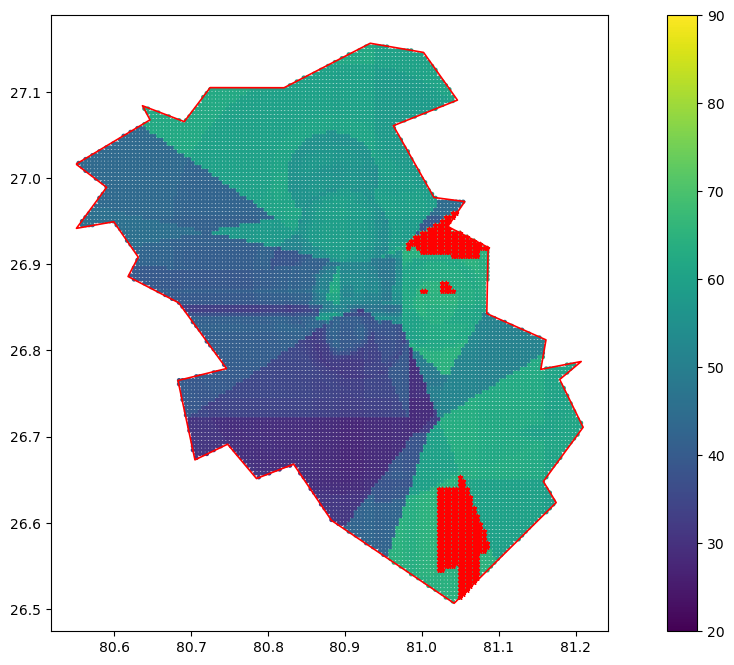

In [88]:
fig, ax = plt.subplots(figsize=(15, 8))
sc = grid_in_up.plot(
    ax=ax,
    column="pred_pm25",
    cmap="viridis",
    markersize=5,
    vmin=20,   # minimum value on color scale
    vmax=90,  # maximum value on color scale
    legend=True
)

up_districts.boundary.plot(ax=ax, color="red", linewidth=1.2)

sensors_gdf = gpd.GeoDataFrame(
    working_df_for_plot_one_timestamp,
    geometry=gpd.points_from_xy(working_df_for_plot_one_timestamp.longitude, working_df_for_plot_one_timestamp.latitude),
    crs="EPSG:4326"
)
sensors_gdf = sensors_gdf.to_crs(up_districts.crs)
sensors_within = sensors_gdf[sensors_gdf.within(up_districts.unary_union)]
# sensors_within.plot(ax=ax, color="white", edgecolor="black", markersize=10, marker="o")
grid_in_up[grid_in_up.pred_pm25>65].plot(ax=ax,markersize=10,color='red',marker="*")

In [85]:
grid_in_up

,latitude,longitude,temp,rh,timestamp,nn_pm25,dist1,dist2,dist3,hour_sin,hour_cos,month_sin,month_cos,weekday,pred_pm25,geometry,index_right,id,d_id_11,Country,Name,Admin,State
440,26.5090,81.0400,32.380000,46.867222,2022-12-07,39.210000,20.290691,29.397277,36.751409,0.0,1.0,-2.449294e-16,1.0,2,64.323120,POINT (81.04 26.509),45,Lucknow,538,INDIA,Lucknow,Gaurav Sahu,Uttar Pradesh
598,26.5135,81.0310,32.380000,46.867222,2022-12-07,39.210000,20.421592,29.311791,35.994747,0.0,1.0,-2.449294e-16,1.0,2,64.323120,POINT (81.031 26.5135),45,Lucknow,538,INDIA,Lucknow,Gaurav Sahu,Uttar Pradesh
599,26.5135,81.0355,32.380000,46.867222,2022-12-07,39.210000,20.149302,29.122460,36.134034,0.0,1.0,-2.449294e-16,1.0,2,64.323120,POINT (81.0355 26.5135),45,Lucknow,538,INDIA,Lucknow,Gaurav Sahu,Uttar Pradesh
600,26.5135,81.0400,32.380000,46.867222,2022-12-07,39.210000,19.883355,28.938804,36.278298,0.0,1.0,-2.449294e-16,1.0,2,64.323120,POINT (81.04 26.5135),45,Lucknow,538,INDIA,Lucknow,Gaurav Sahu,Uttar Pradesh
601,26.5135,81.0445,32.380000,46.867222,2022-12-07,39.210000,19.624008,28.760932,36.427479,0.0,1.0,-2.449294e-16,1.0,2,64.323120,POINT (81.0445 26.5135),45,Lucknow,538,INDIA,Lucknow,Gaurav Sahu,Uttar Pradesh
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23297,27.1525,80.9365,31.976667,45.412222,2022-12-07,93.173333,17.629422,24.491613,24.491613,0.0,1.0,-2.449294e-16,1.0,2,62.241531,POINT (80.9365 27.1525),45,Lucknow,538,INDIA,Lucknow,Gaurav Sahu,Uttar Pradesh
23298,27.1525,80.9410,31.976667,45.412222,2022-12-07,93.173333,17.766563,24.564256,24.564256,0.0,1.0,-2.449294e-16,1.0,2,60.143993,POINT (80.941 27.1525),45,Lucknow,538,INDIA,Lucknow,Gaurav Sahu,Uttar Pradesh
23299,27.1525,80.9455,31.976667,45.412222,2022-12-07,93.173333,17.913739,24.644745,24.644745,0.0,1.0,-2.449294e-16,1.0,2,60.143993,POINT (80.9455 27.1525),45,Lucknow,538,INDIA,Lucknow,Gaurav Sahu,Uttar Pradesh
23300,27.1525,80.9500,31.976667,45.412222,2022-12-07,93.173333,18.070703,24.733004,24.733004,0.0,1.0,-2.449294e-16,1.0,2,60.143993,POINT (80.95 27.1525),45,Lucknow,538,INDIA,Lucknow,Gaurav Sahu,Uttar Pradesh
